In [97]:
import re

In [98]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import os
import glob
import matplotlib.pyplot as plt

In [99]:
!sudo apt-get install tesseract-ocr

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [100]:
!apt-get install tesseract-ocr
!apt-get install libtesseract-dev

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libtesseract-dev is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


#1 -  IMAGE PREPROCESSING






The objective is to prepare cheque images for accurate text extraction by removing unwanted elements like the bank logo and specific text (Logo, "OR BEARER"), enhancing the image quality through grayscale conversion, blurring, and thresholding,

In [101]:
import os

file_path = '/content/Cheque 309061.jpg'
print(os.path.exists(file_path))


True


In [ ]:
# Import the necessary libraries
import cv2
from google.colab.patches import cv2_imshow

# Read the image file 'Cheque 309061.jpg' from the specified path
image = cv2.imread('/content/Cheque 309061.jpg')

# Display the image using the OpenCV function cv2_imshow
cv2_imshow(image)


In [ ]:
# Get the color of the pixel at coordinates (100, 1000) to remove bank logo
(b, g, r) = image[100, 1000]
for i in range(0, 186):
          for j in range(0, 1792):
              image[i, j] = (b, g, r)
cv2_imshow(image)


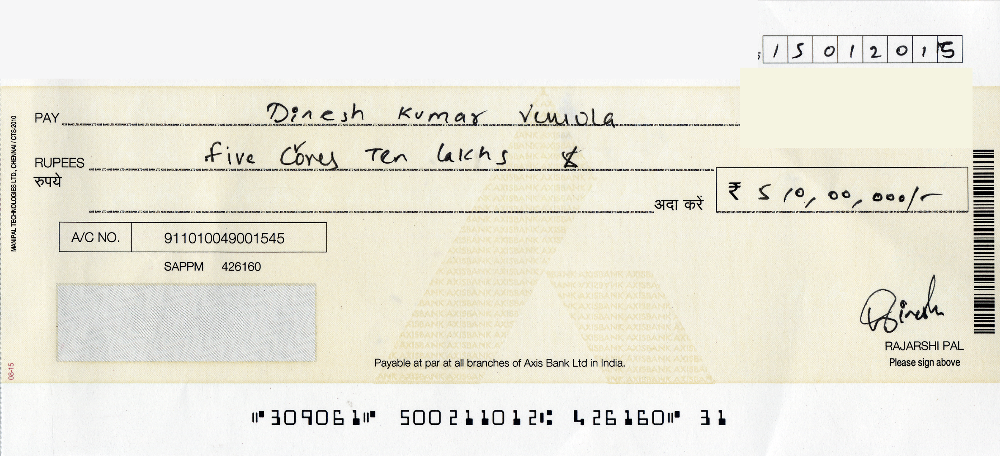

In [104]:
# Get the color of the pixel at coordinates (220,2300) to remove or bearer
(b2, g2, r2) = image[220, 2300]
for i in range(160, 350):
        for j in range(1750, 2300):
            image[i, j] = (b2, g2, r2)
cv2_imshow(image)

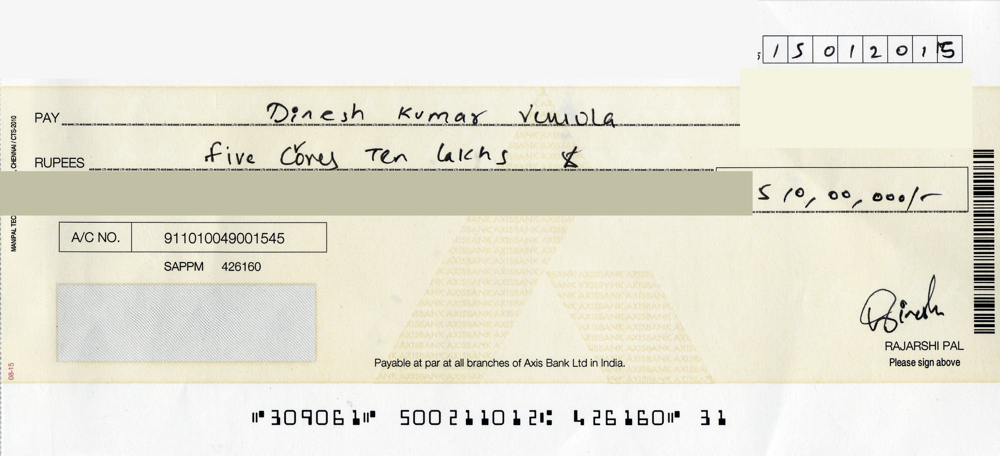

In [105]:
# Get the color of the pixel at coordinates (500, 750) to remove the line
(b3, g3, r3) = image[500, 750]
for i in range(405, 510):
        for j in range(0, 1780):
            image[i, j] = (b3, g3, r3)
cv2_imshow(image)

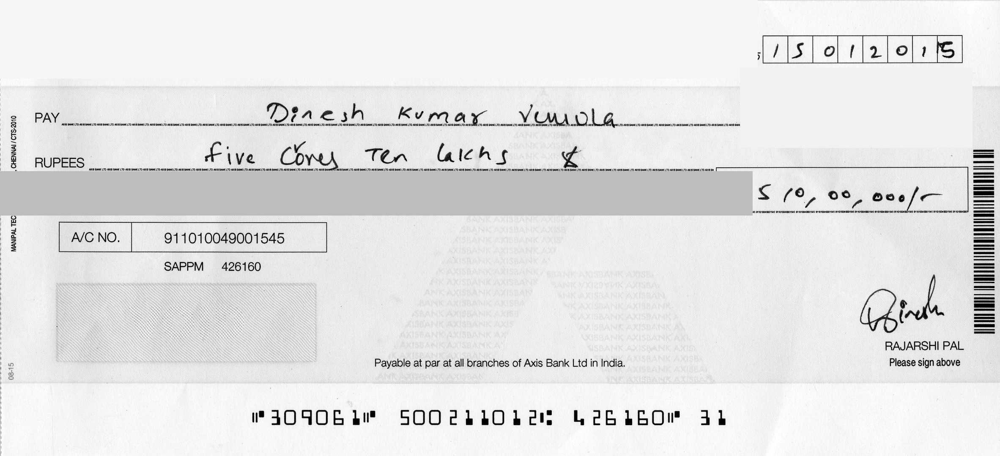

In [106]:
# Convert the image to grayscale
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image)

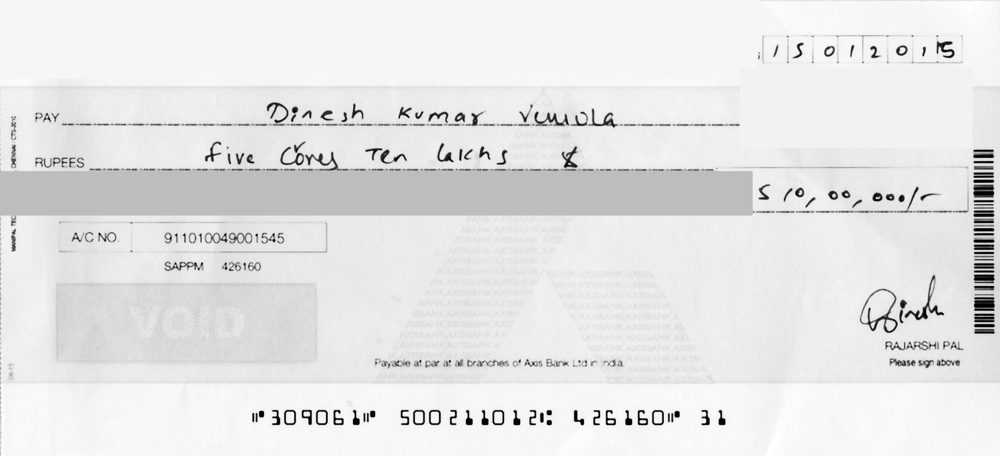

In [107]:
# Apply a median blur filter to the grayscale image
image=cv2.medianBlur(image,5)
cv2_imshow(image)

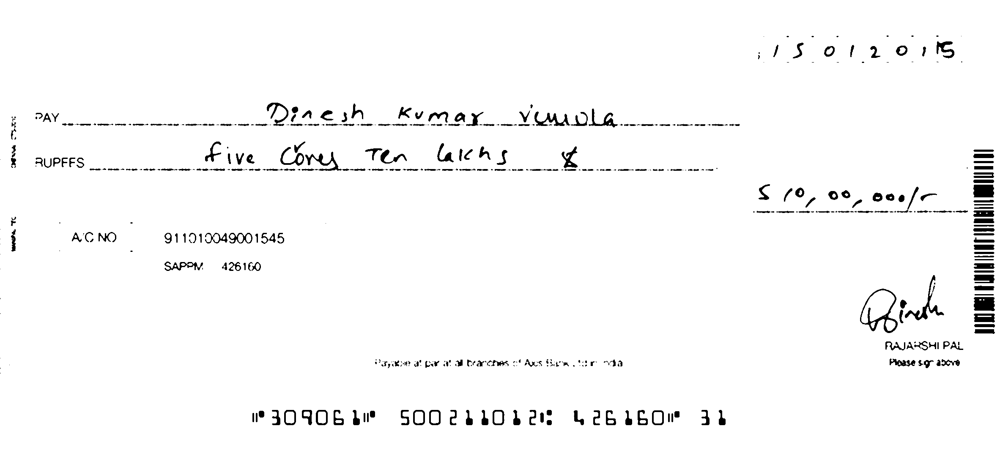

In [108]:
#convert the grayscale image to a binary image
image=cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
cv2_imshow(image)

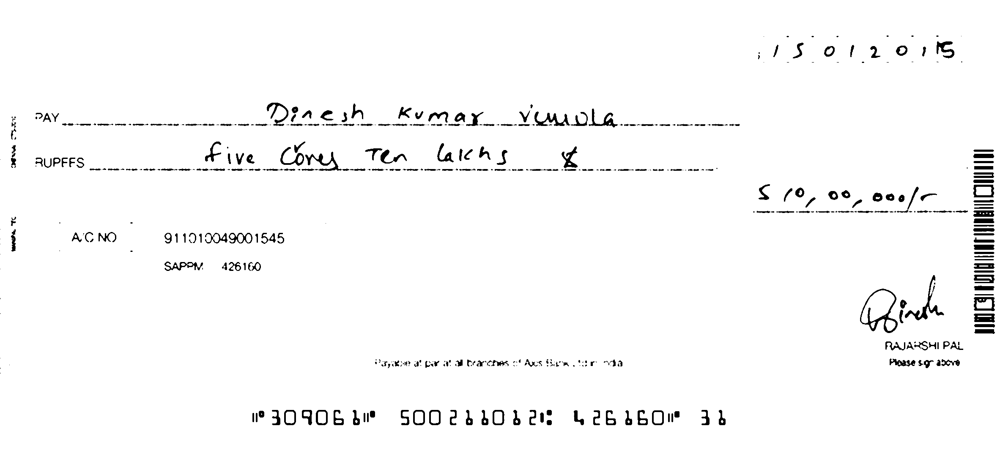

In [109]:
# Apply adaptive thresholding using Gaussian weighting to the grayscale image
image=cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,15,5)
cv2_imshow(image)

#2-Segmentation

The objective is to divide the cheque image into distinct segments that correspond to specific data fields, such as the cheque ID, the amount in words, the numerical amount, the client's name, and the date. By isolating these regions, the function facilitates more precise extraction and processing of this information in later steps, such as OCR (Optical Character Recognition)

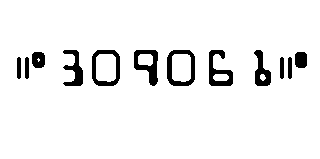

In [110]:
# Extract the cheque ID from the image
id_image = image[920:1200, 580:900]
cv2_imshow(id_image)

In [111]:
cv2.imwrite('id.jpg',id_image)

True

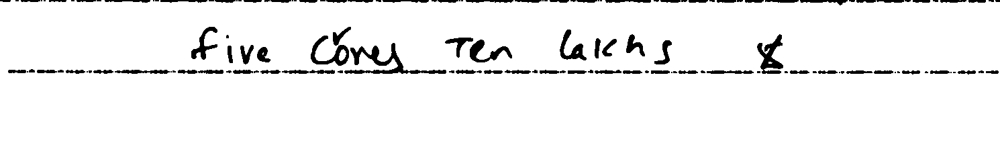

In [112]:
image = image[40:530, 200:2285]
# Extract the cheque words amount from the image
words_image = image[255:480, 0:1490]
words_image=cv2.erode(words_image,np.ones((2,2),np.uint8),iterations=1)
cv2_imshow(words_image)

In [113]:
cv2.imwrite('words.jpg',words_image)

True

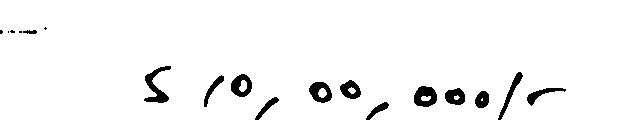

In [114]:
# Extract the cheque digits amount from the image
amount_image = image[330:450, 1450:2085]
cv2_imshow(amount_image)

In [115]:
cv2.imwrite('amount.jpg',amount_image)

True

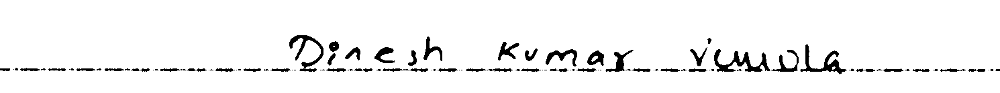

In [116]:
# Extract the cheque client name from the image
client_image = image[150:290, 0:1490]
cv2_imshow(client_image)

In [117]:
cv2.imwrite('client.jpg',client_image)

True

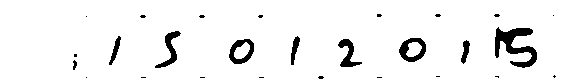

In [118]:
# Extract the cheque date from the image
date_image = image[30:109, 1520:2090]

cv2_imshow(date_image)



In [119]:
cv2.imwrite('date.jpg', date_image)

True

#3-Preprocessing of Digit Images


The objective is to preprocess and recognize digits from various cheque images by applying a series of image processing techniques tailored to different regions of the cheque by applying Gaussian blur, Otsu's thresholding, and contour detection to isolate and standardize each digit

In [120]:

def preprocess_date_image(image_path):
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply GaussianBlur to reduce noise
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply Otsu's thresholding
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Find contours
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Sort contours from left to right
    contours = sorted(contours, key=lambda ctr: cv2.boundingRect(ctr)[0])

    digit_images = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        if h >= 9 and w >= 8:  # Filter small contours
            digit_image = binary_image[y:y + h, x:x + w]
            # Add margins around the digit
            margin = 9
            digit_image = cv2.copyMakeBorder(digit_image, margin, margin, margin, margin, cv2.BORDER_CONSTANT, value=[0, 0, 0])
            # Resize to 28x28 pixels
            digit_image = cv2.resize(digit_image, (28, 28), interpolation=cv2.INTER_AREA)
            digit_images.append(digit_image)

    # If the number of extracted digits is not 8, display a warning message
    if len(digit_images) != 8:
        print(f"Warning: {len(digit_images)} digits detected, 8 digits expected.")

    return digit_images

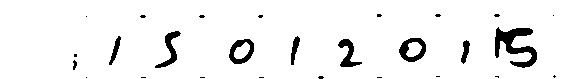

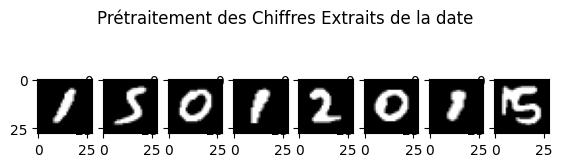

In [121]:
# Path to your image file
image_path = '/content/date.jpg'
original_image = cv2.imread(image_path)
cv2_imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct color display

# Preprocess the image to obtain handwritten digits
digit_images = preprocess_date_image(image_path)



# Display the extracted digits
# Display the extracted digits
plt.figure(figsize=(6.6, 2))
for i, digit_image in enumerate(digit_images):
    plt.subplot(1, len(digit_images), i + 1)
    plt.imshow(digit_image, cmap='gray')
# Add a title for the entire figure
plt.suptitle('Prétraitement des Chiffres Extraits de la date')
plt.show()

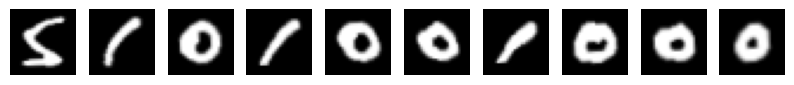

In [122]:
import numpy as np
import cv2
from matplotlib import pyplot as plt



def rotate_image(image, angle):
    center = (image.shape[1] // 2, image.shape[0] // 2)
    rot_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_image = cv2.warpAffine(image, rot_matrix, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=(0, 0, 0))
    return rotated_image

# Preprocessing function for amount image
def preprocess_amount_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)
    binary_image = cv2.adaptiveThreshold(blurred_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
    binary_image = rotate_image(binary_image, -2)

    # Find contours
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=lambda ctr: cv2.boundingRect(ctr)[0])

    digit_images = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        if h >= 16 and w >= 5 and h <= 39 and w <= 35:  # Adjusted width criteria to include commas
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 0), 1)
            digit_image = binary_image[y:y + h, x:x + w]
            margin = 6
            digit_image = cv2.copyMakeBorder(digit_image, margin, margin, margin, margin, cv2.BORDER_CONSTANT, value=[0, 0, 0])
            digit_image = rotate_image(digit_image, 5)
            digit_image = cv2.resize(digit_image, (28, 28), interpolation=cv2.INTER_AREA)
            digit_images.append(digit_image)

    return digit_images



# Path to your amount image file
amount_image_path = '/content/amount.jpg'

# Preprocess the image to extract handwritten digits
amount_digit_images = preprocess_amount_image(amount_image_path)



# Display the extracted digits
fig, axes = plt.subplots(1, len(amount_digit_images), figsize=(10, 3))
for i, digit_image in enumerate(amount_digit_images):
    axes[i].imshow(digit_image, cmap='gray')
    axes[i].axis('off')
plt.show()


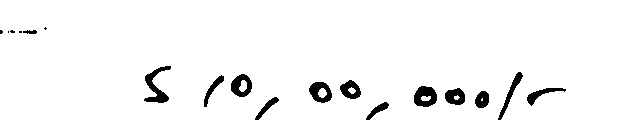

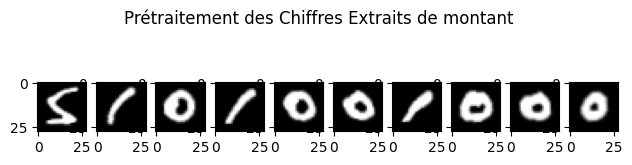

In [123]:
# Path to your image file
image_path = '/content/amount.jpg'
original_image = cv2.imread(image_path)
cv2_imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct color display

# Preprocess the image to obtain handwritten digits
digit_images = preprocess_amount_image(image_path)



# Display the extracted digits
# Display the extracted digits
plt.figure(figsize=(7.5, 2))
for i, digit_image in enumerate(digit_images):
    plt.subplot(1, len(digit_images), i + 1)
    plt.imshow(digit_image, cmap='gray')
# Add a title for the entire figure
plt.suptitle('Prétraitement des Chiffres Extraits de montant')
plt.show()

In [124]:
def rotate_image(image, angle):
    center = (image.shape[1] // 2, image.shape[0] // 2)
    rot_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_image = cv2.warpAffine(image, rot_matrix, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=(0, 0, 0))
    return rotated_image

def preprocess_id_image(image_path):
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply GaussianBlur to reduce noise
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply Otsu's thresholding
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Apply morphological operations to enhance digit clarity
    kernel = np.ones((3, 3), np.uint8)
    binary_image = cv2.erode(binary_image, kernel, iterations=1)
    binary_image = cv2.dilate(binary_image, kernel, iterations=1)

    # Find contours
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Sort contours from left to right
    contours = sorted(contours, key=lambda ctr: cv2.boundingRect(ctr)[0])

    digit_images = []
    for i, contour in enumerate(contours):
        if i == 0 or i == len(contours) - 1:
            continue  # Ignore the first and last contours

        x, y, w, h = cv2.boundingRect(contour)

        # Ensure the contour has reasonable height and width
        if h >= 10 and w >= 5:
            # Extract the digit image region
            digit_image = binary_image[y:y + h, x:x + w]

            # Add margins around the digit
            margin = 13
            digit_image = cv2.copyMakeBorder(digit_image, margin, margin, margin, margin, cv2.BORDER_CONSTANT, value=[0, 0, 0])

            # Rotate the digit image slightly
            digit_image = rotate_image(digit_image, -4)

            # Resize to 28x28 pixels
            digit_image = cv2.resize(digit_image, (28, 28), interpolation=cv2.INTER_AREA)

            digit_images.append(digit_image)

    return digit_images, binary_image

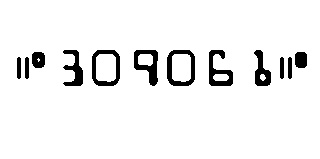

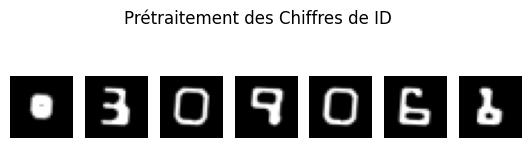

In [125]:
# Path to your image file
image_path = '/content/id.jpg'
original_image = cv2.imread(image_path)
cv2_imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct color display

# Preprocess the image to obtain handwritten digits
digit_images, _ = preprocess_id_image(image_path)  # unpack the return values, ignoring the second

# Display the extracted digits

fig, axes = plt.subplots(1, len(digit_images), figsize=(6.6, 2))
for i, digit_image in enumerate(digit_images):
    axes[i].imshow(digit_image, cmap='gray')
    axes[i].axis('off')


# Add a title for the entire figure
plt.suptitle('Prétraitement des Chiffres de ID')
plt.show()

#4-Models

##1-KNN MODEL

The objective of creating a k-Nearest Neighbors (kNN) model is to develop a robust and efficient digit recognition system capable of accurately classifying handwritten digits. By leveraging kNN, which classifies digits based on their similarity to labeled training examples. The kNN model aims to provide a reliable and straightforward solution for digit recognition tasks, useful for applications in areas such as optical character recognition (OCR) and automated data entry systems

###data prep


> Ajouter une citation



In [126]:
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report


In [127]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Define rotation angles
angles = [-10, -5, 5, 10]

# Function to apply augmentations
def augment_image(image, angles):
    rows, cols = image.shape
    augmented_images = []

    for angle in angles:
        # Rotate the image
        M = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
        rotated = cv2.warpAffine(image, M, (cols, rows))

        # Translate the image
        tx = np.random.uniform(-1, 1)
        ty = np.random.uniform(-1, 1)
        M = np.float32([[1, 0, tx], [0, 1, ty]])
        translated = cv2.warpAffine(rotated, M, (cols, rows))

        # Add random noise
        noise = np.random.randn(rows, cols) * 5
        noisy = translated + noise
        noisy = np.clip(noisy, 0, 255)

        augmented_images.append(noisy.astype(np.uint8))

    return augmented_images

# Load the digits image
img = cv2.imread('./digits.png')

# Check if the image was loaded successfully
if img is None:
    print("Error: Could not load image . Please check the file path.")
else:
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Split the image into 5000 cells, each 20x20 size
    cells = [np.hsplit(row, 100) for row in np.vsplit(gray, 50)]
    x = np.array(cells)

    # Prepare train_data and test_data
    train = x[:, :50].reshape(-1, 400).astype(np.float32)
    test = x[:, 50:100].reshape(-1, 400).astype(np.float32)

    # Apply data augmentation to training data
    augmented_train = []
    for img in train:
        img_reshaped = img.reshape(20, 20)
        augmented_images = augment_image(img_reshaped, angles)
        for aug_img in augmented_images:
            augmented_train.append(aug_img.reshape(-1))
    augmented_train = np.array(augmented_train, dtype=np.float32)

    # Create labels for train and test data
    k = np.arange(10)
    train_labels = np.repeat(k, 250)[:, np.newaxis]
    augmented_train_labels = np.repeat(train_labels, len(angles), axis=0)  # Repeat labels for augmented data

    test_labels = train_labels.copy()

###model training

In [128]:
# Train kNN
knn = cv2.ml.KNearest_create()
knn.train(augmented_train, cv2.ml.ROW_SAMPLE, augmented_train_labels)

True

###Predict on test data


In [129]:
ret, results, neighbours, dist = knn.findNearest(test, k=5)

###Evaluation

In [130]:
# Check accuracy
matches = results == test_labels
correct = np.count_nonzero(matches)
accuracy = correct * 100.0 / results.size
print(f'Accuracy: {accuracy}%')

# Save the trained data
np.savez('knn_data.npz', train=augmented_train, train_labels=augmented_train_labels)

Accuracy: 94.36%


In [131]:
# Calculate precision, recall, and F1 score
precision = precision_score(test_labels, results, average='weighted')
recall = recall_score(test_labels, results, average='weighted')
f1 = f1_score(test_labels, results, average='weighted')

print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')

Precision: 0.94
Recall: 0.94
F1 Score: 0.94


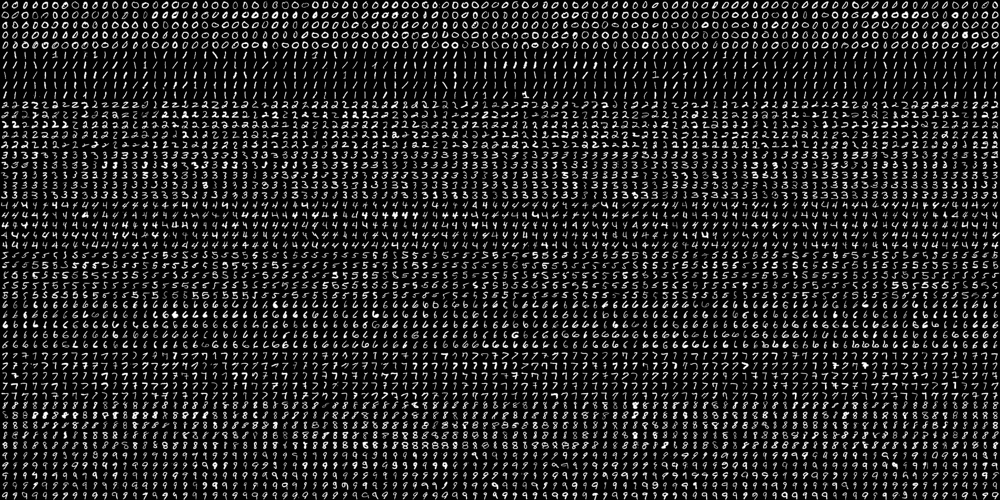

In [132]:
img = cv2.imread('./digits.png')
cv2_imshow(img)

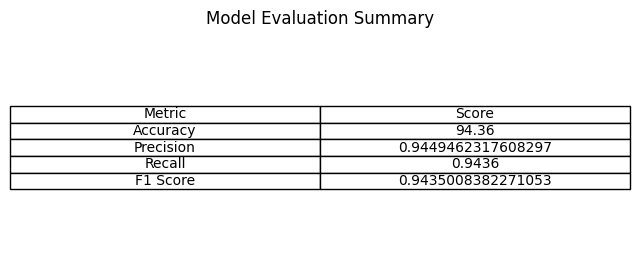

In [133]:
summary_data = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Score': [accuracy, precision, recall, f1]
}
import pandas as pd
df_summary = pd.DataFrame(summary_data)

# Plot the summary table
fig, ax = plt.subplots(figsize=(8, 3))
ax.axis('tight')
ax.axis('off')
table_data = [df_summary.columns.to_list()] + df_summary.values.tolist()
table = ax.table(cellText=table_data, colLabels=None, cellLoc='center', loc='center')

plt.title('Model Evaluation Summary')
plt.show()

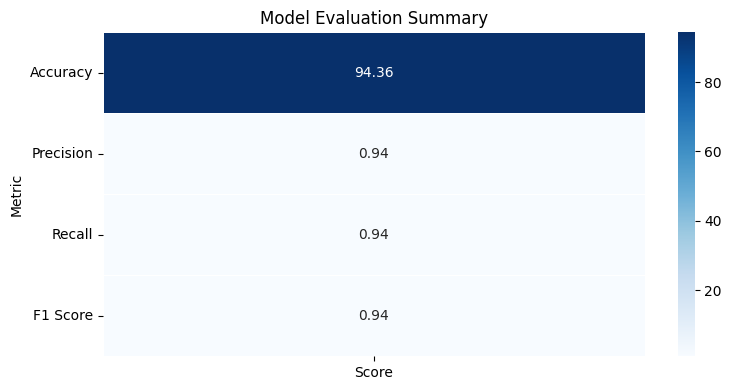

In [134]:
# Create a DataFrame for the summary
summary_data = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Score': [accuracy, precision, recall, f1]
}

df_summary = pd.DataFrame(summary_data).set_index('Metric')
import seaborn as sns
# Create a heatmap
plt.figure(figsize=(8, 4))
sns.heatmap(df_summary, annot=True, cmap='Blues', fmt='.2f', linewidths=.5)

# Set title and labels
plt.title('Model Evaluation Summary')
plt.yticks(rotation=0)  # Rotate y-axis labels to be horizontal

# Display the plot
plt.tight_layout()
plt.show()

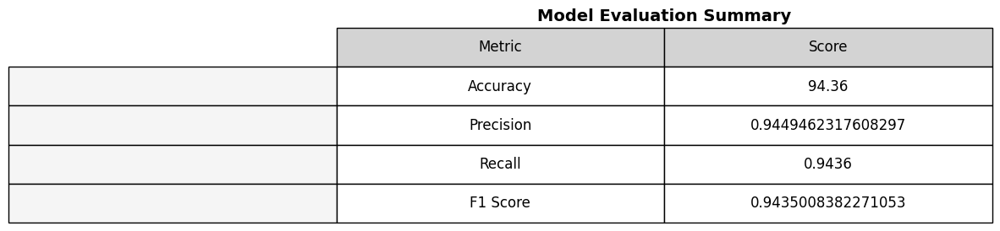

In [135]:
# Create a DataFrame for the summary
summary_data = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Score': [accuracy, precision, recall, f1]
}

df_summary = pd.DataFrame(summary_data)

# Plot the summary table
fig, ax = plt.subplots(figsize=(10, 3))  # Adjust figsize as needed
ax.axis('tight')
ax.axis('off')

# Create the table
table = ax.table(cellText=df_summary.values,
                 colLabels=df_summary.columns,
                 cellLoc='center',
                 loc='center',
                 rowColours=['#f5f5f5']*len(df_summary),
                 colColours=['#d3d3d3']*len(df_summary.columns),
                 bbox=[0, 0, 1, 1])

# Style the table
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)  # Adjust the table size

# Add title
plt.title('Model Evaluation Summary', fontsize=14, weight='bold')

# Display the plot
plt.show()

In [136]:
# Detailed classification report
report = classification_report(test_labels, results)
print(report)

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       250
           1       0.93      0.99      0.96       250
           2       0.97      0.90      0.93       250
           3       0.95      0.96      0.95       250
           4       0.97      0.88      0.92       250
           5       0.94      0.94      0.94       250
           6       0.96      1.00      0.98       250
           7       0.94      0.95      0.95       250
           8       0.97      0.91      0.94       250
           9       0.86      0.93      0.89       250

    accuracy                           0.94      2500
   macro avg       0.94      0.94      0.94      2500
weighted avg       0.94      0.94      0.94      2500



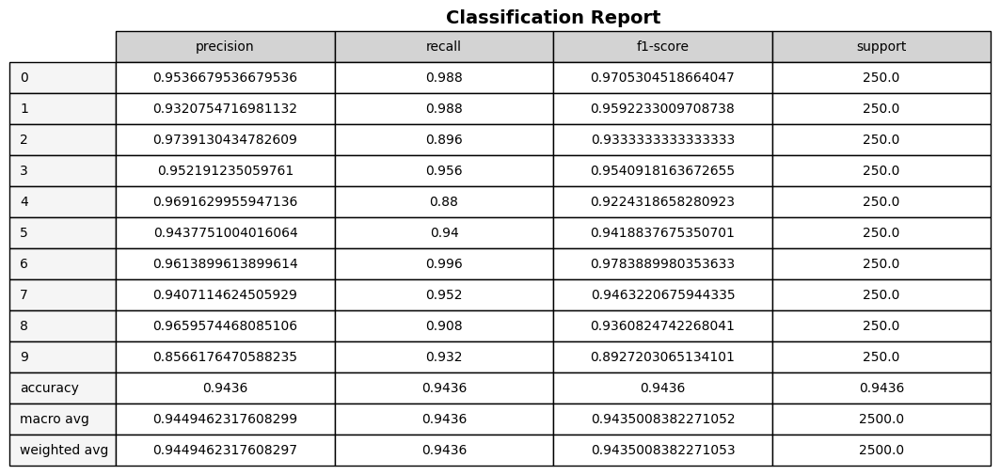

In [137]:
report = classification_report(test_labels, results, output_dict=True)

# Convert the report to a DataFrame for better visualization
report_df = pd.DataFrame(report).transpose()

# Plot the classification report as a table
fig, ax = plt.subplots(figsize=(12, 6))  # Adjust figsize as needed
ax.axis('tight')
ax.axis('off')

# Create the table
table = ax.table(cellText=report_df.values,
                 colLabels=report_df.columns,
                 rowLabels=report_df.index,
                 cellLoc='center',
                 loc='center',
                 rowColours=['#f5f5f5']*(len(report_df)),
                 colColours=['#d3d3d3']*len(report_df.columns),
                 bbox=[0, 0, 1, 1])

# Style the table
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.2, 1.2)  # Adjust the table size

# Add title
plt.title('Classification Report', fontsize=14, weight='bold')

# Display the plot
plt.show()

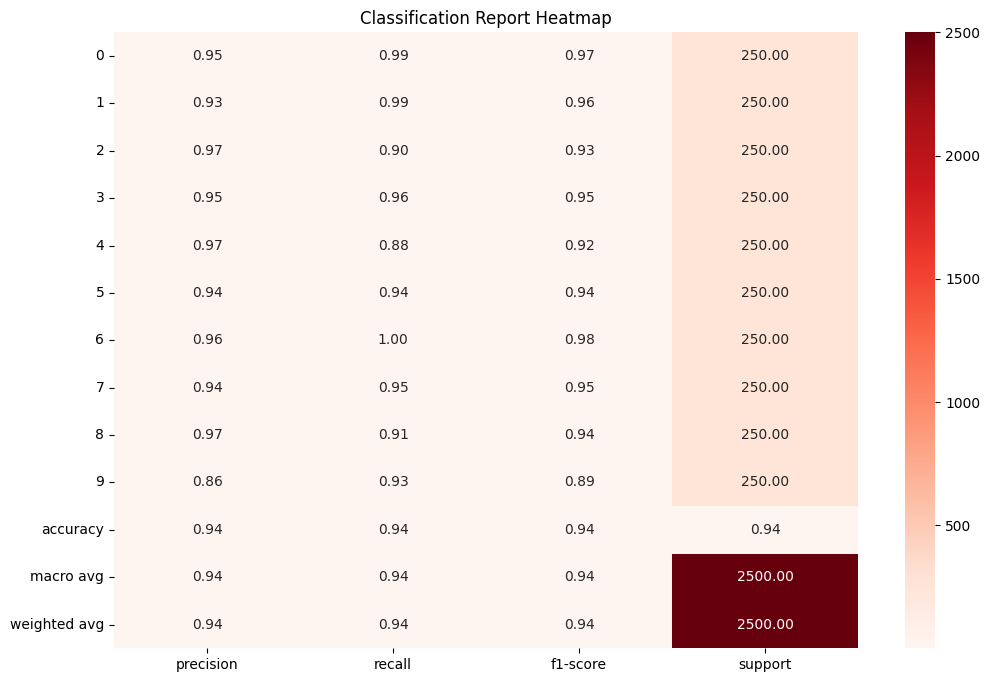

In [138]:
# Visualiser le rapport de classification en heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(report_df[['precision', 'recall', 'f1-score', 'support']], annot=True, fmt='.2f', cmap='Reds', cbar=True)
plt.title('Classification Report Heatmap')
plt.show()

In [139]:
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier

# Initialize the KNN classifier
knn_classifier = KNeighborsClassifier(n_neighbors=5)

# Perform K-fold cross-validation
scores = cross_val_score(knn_classifier, train, train_labels.ravel(), cv=10, scoring='accuracy')

print(f'Cross-Validation Accuracy: {scores.mean():.2f} ± {scores.std():.2f}')


Cross-Validation Accuracy: 0.92 ± 0.01


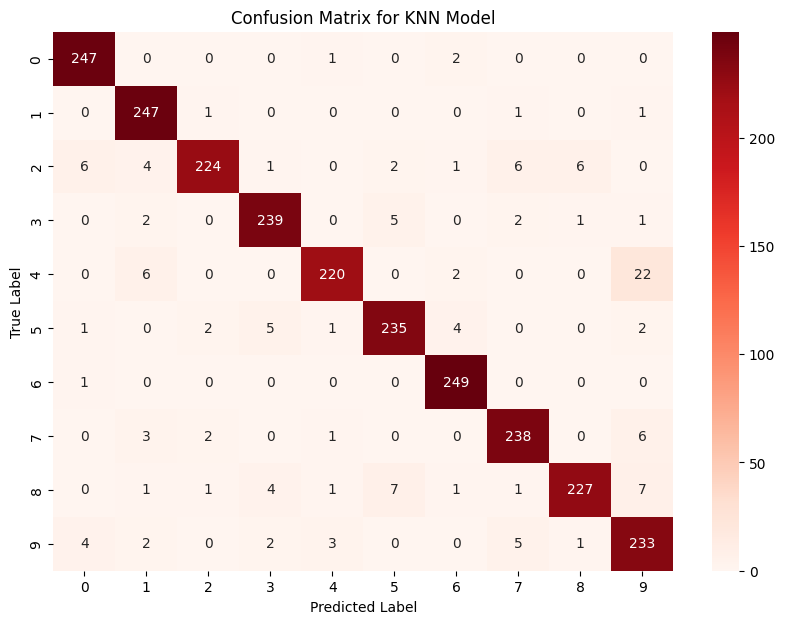

In [140]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(test_labels, results)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', xticklabels=k, yticklabels=k)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for KNN Model')
plt.show()


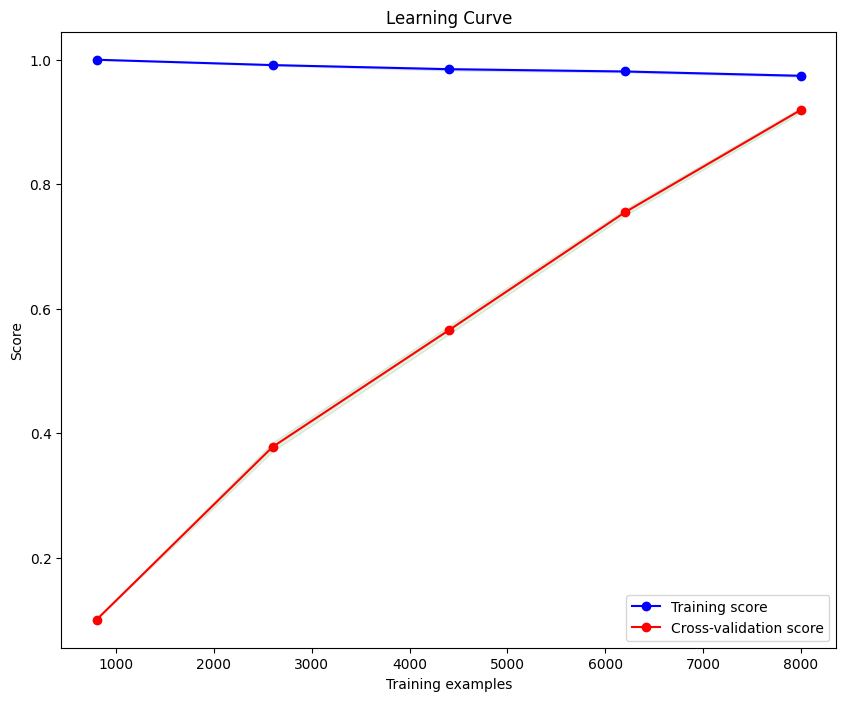

In [141]:
from sklearn.model_selection import learning_curve

# Calculer la courbe d'apprentissage
train_sizes, train_scores, test_scores = learning_curve(knn_classifier, augmented_train, augmented_train_labels, cv=5, n_jobs=-1)

# Calculer la moyenne et l'écart type des scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Visualiser la courbe d'apprentissage
plt.figure(figsize=(10, 8))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_mean, 'o-', color='red', label='Cross-validation score')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='green')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()


In [142]:
!pip install paddleocr
!pip install paddlepaddle-gpu==2.3.0

#5-Prediction


The objective of the code is to extract information from cheque images using a combination of machine learning and OCR techniques. Specifically, it employs k-Nearest Neighbors (kNN) for recognizing handwritten digits, PaddleOCR for extracting text such as cheque IDs and amounts, and PyTesseract for further text extraction and validation.

##KNN model

###date prediction

Predicted Date: 15/01/2015


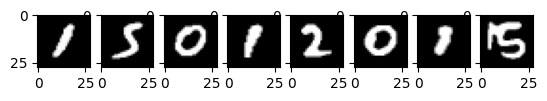

In [143]:

def predicted_date(To_predict_images_date):
    digit_str = ""

    # Load the trained kNN model data
    with np.load('/content/knn_data.npz') as data:
        train = data['train']
        train_labels = data['train_labels']

    # Initialize kNN
    knn = cv2.ml.KNearest_create()
    knn.train(train, cv2.ml.ROW_SAMPLE, train_labels)

    for image in To_predict_images_date:
        # Resize image to 20x20 pixels to match training data
        image = cv2.resize(image, (20, 20), interpolation=cv2.INTER_AREA)
        image = image.reshape(-1, 400).astype(np.float32)

        # Predict the class
        ret, result, neighbours, dist = knn.findNearest(image, k=5)
        digit = int(result[0][0])
        digit_str += str(digit)

    digit_str = list(digit_str)
    digit_str.insert(2, '/')
    digit_str.insert(5, '/')
    final_string = ''.join(digit_str)
    return final_string

# Path to your image file
image_path = '/content/date.jpg'

# Preprocess the image to obtain handwritten digits
digit_images = preprocess_date_image(image_path)

# Predict the date from the extracted digit images
predicted_date_str = predicted_date(digit_images)

print("Predicted Date:", predicted_date_str)

# Display the extracted digits
for i, digit_image in enumerate(digit_images):
    plt.subplot(1, len(digit_images), i + 1)
    plt.imshow(digit_image, cmap='gray')

plt.show()


###amount prediction

Predicted Amount: 51000000


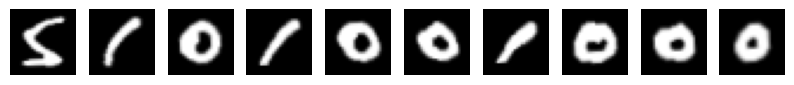

In [144]:
def insert_commas(digit_str):
    # Initialiser la chaîne résultante
    result = ''

    # Initialiser le compteur pour les positions
    count = 0

    # Parcourir la chaîne de chiffres
    i = 0
    while i < len(digit_str):
        if count == 3:
            # Insérer une virgule si nécessaire
            if i < len(digit_str) and digit_str[i] == '1':
                result += ''
                count = 1
                i += 1
            else:
                result += digit_str[i]
                count = 1
                i += 1
        elif count == 6:
            # Insérer une virgule si nécessaire
            if i < len(digit_str) and digit_str[i] == '1':
                result += ''
                count = 1
                i += 1
            else:
                result += digit_str[i]
                count = 1
                i += 1
        else:
            # Ajouter le chiffre et incrémenter le compteur
            result += digit_str[i]
            count += 1
            i += 1

    return result

def predicted_amount(To_predict_images):
    digit_str = ""
    hindi_numerals = {
        0: '0', 1: '1', 2: '2', 3: '3', 4: '4',
        5: '5', 6: '6', 7: '7', 8: '8', 9: '9'
    }

    with np.load('knn_data.npz') as data:
        train = data['train']
        train_labels = data['train_labels']
    knn = cv2.ml.KNearest_create()
    knn.train(train, cv2.ml.ROW_SAMPLE, train_labels)

    for image in To_predict_images:
        image = cv2.resize(image, (20, 20), interpolation=cv2.INTER_AREA)
        image = image.reshape(-1, 400).astype(np.float32)
        ret, result, neighbours, dist = knn.findNearest(image, k=4)
        digit = int(result[0][0])
        digit_str += hindi_numerals.get(digit, '')

    # Remove possible misplaced commas from digit_str
    digit_str = digit_str.replace(',', '')

    # Insert commas based on custom logic
    formatted_amount = insert_commas(digit_str)

    return formatted_amount

# Exemple d'utilisation
amount_image_path = 'amount.jpg'
amount_digit_images = preprocess_amount_image(amount_image_path)
predicted_amount_digit = predicted_amount(amount_digit_images)
print("Predicted Amount:", predicted_amount_digit)
# Display the extracted digits
fig, axes = plt.subplots(1, len(amount_digit_images), figsize=(10, 3))
for i, digit_image in enumerate(amount_digit_images):
    axes[i].imshow(digit_image, cmap='gray')
    axes[i].axis('off')
plt.show()

##PaddleOCR:id prediction

In [145]:
!pip install paddlepaddle
!pip install paddleocr

In [146]:
!sudo apt-get install tesseract-ocr
!pip install paddlepaddle paddleocr


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [147]:
!pip install paddlepaddle
!pip install paddleocr


In [148]:
!pip install paddlepaddle
!pip install paddleocr


In [ ]:

from paddleocr import PaddleOCR

[2024/08/11 13:16:57] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_c

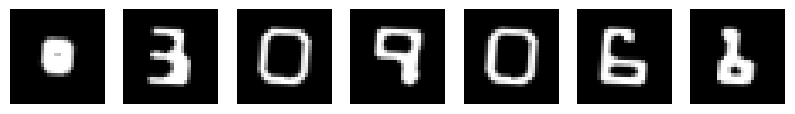

Montant prédit avec PaddleOCR : 309061


In [150]:
import cv2
import numpy as np
from matplotlib import pyplot as plt




def paddle_ocr_id(image_path):
    # Initialize PaddleOCR
    ocr = PaddleOCR(use_angle_cls=True, lang='en')

    # Perform OCR on the image
    result = ocr.ocr(image_path, cls=True)

    # Extract text from the result
    extracted_text = []
    for line in result:
        for word_info in line:
            extracted_text.append(word_info[-1][0])

    # Combine the extracted text into a single string
    digit_str = ''.join(extracted_text)

    # Remove any non-numeric characters
    cleaned_digit_str = ''.join(filter(str.isdigit, digit_str))

    return cleaned_digit_str

# Chemin vers votre fichier image
image_path = "./id.jpg"

# Prétraiter l'image pour améliorer la qualité des digits
digit_images, binary_image = preprocess_id_image(image_path)

# Utiliser PaddleOCR pour extraire le montant
predicted_id_str = paddle_ocr_id(image_path)

# Afficher les digits extraits et le montant prédit
fig, axes = plt.subplots(1, len(digit_images), figsize=(10, 3))
for i, digit_image in enumerate(digit_images):
    axes[i].imshow(digit_image, cmap='gray')
    axes[i].axis('off')

plt.show()

print("Montant prédit avec PaddleOCR :", predicted_id_str)


##Pytesseract

In [151]:
!pip install pytesseract

[2024/08/11 13:17:02] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.5, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_c

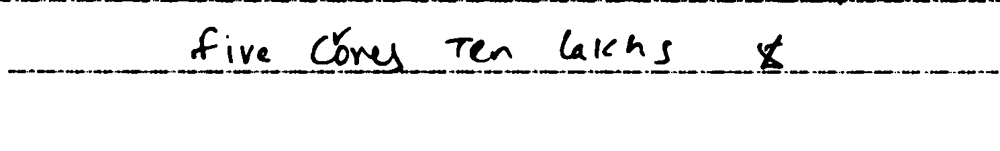

In [152]:
import cv2
import numpy as np
from paddleocr import PaddleOCR

# Function to preprocess the image
def preprocess_image(image_path):
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply binary thresholding (adaptive thresholding can also be used)
    _, binary_image = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

    # Further preprocessing: erosion to clean noise
    binary_image = cv2.erode(binary_image, np.ones((1, 1), np.uint8), iterations=10)

    return binary_image

# Function to extract text using PaddleOCR
def extract_text_from_image(image_path):
    # Preprocess the image
    processed_image = preprocess_image(image_path)

    # Save the processed image temporarily
    temp_image_path = "temp_processed_image.png"
    cv2.imwrite(temp_image_path, processed_image)

    # Initialize PaddleOCR with adjusted parameters
    ocr = PaddleOCR(use_angle_cls=True, lang='en', drop_score=0.3, det_db_box_thresh=0.5)

    # Perform OCR on the processed image
    result = ocr.ocr(temp_image_path, cls=True)

    # Extract text from OCR result
    extracted_text = " ".join([line[1][0] for line in result[0]])

    return extracted_text

image_path='./words.jpg'
predicted_amount = extract_text_from_image(image_path)

# Afficher le texte extrait
print("Predicted amount:", predicted_amount)
original_image = cv2.imread(image_path)
cv2_imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))

Predicted amount: Five Cony, Ten leichs __



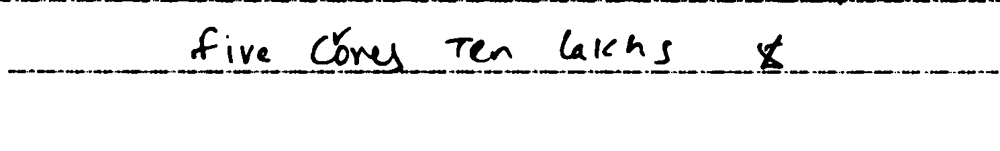

In [153]:
# Fonction pour prétraiter l'image et extraire le texte OCR
import pytesseract
def preprocess_image(image_path):
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply binary thresholding (adaptive thresholding can also be used)
    _, binary_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

    # Further preprocessing: erosion to clean noise
    binary_image = cv2.erode(binary_image, np.ones((2, 2), np.uint8), iterations=4)

    return binary_image
def extract_text_from_image(image_path):
    # Prétraiter l'image
    preprocessed_image = preprocess_image(image_path)

    # Extraire le texte avec Tesseract
    text = pytesseract.image_to_string(preprocessed_image, config='--psm 6 ')


    return text
image_path='./words.jpg'
predicted_amount = extract_text_from_image(image_path)

# Afficher le texte extrait
print("Predicted amount:", predicted_amount)
original_image = cv2.imread(image_path)
cv2_imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))

Predicted client name: ___________ Dgaesh_ _Kymay Yuuole



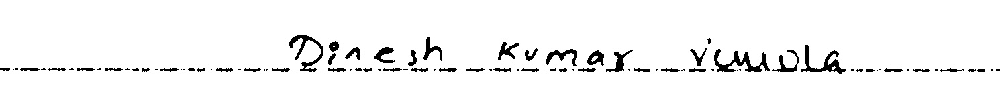

In [154]:
image_path='./client.jpg'
predicted_client = extract_text_from_image(image_path)

print("Predicted client name:", predicted_client)
original_image = cv2.imread(image_path)
cv2_imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))

#6-Save on csv and db

In [155]:
def save_to_sqlite(image_path, ocr_results, conn):
    c = conn.cursor()
    c.execute("""
        INSERT OR REPLACE INTO ocr_results (image_path, amount, date, words, client, id)
        VALUES (:image_path, :amount, :date, :words, :client, :id)
        """, {

        'amount': ocr_results['amount'],
        'date': ocr_results['date'],
        'words': ocr_results['words'],
        'client': ocr_results['client'],
        'id': ocr_results['id']
    })
    conn.commit()

def save_to_csv(image_path, ocr_results, csv_writer):
    csv_writer.writerow({
        'image_path': image_path,
        'amount': ocr_results['amount'],
        'date': ocr_results['date'],
        'words': ocr_results['words'],
        'client': ocr_results['client'],
        'id': ocr_results['id']
    })

In [156]:
import sqlite3

def create_table_if_not_exists(conn):
    c = conn.cursor()
    c.execute("""
        CREATE TABLE IF NOT EXISTS ocr_results (

            amount TEXT,
            date TEXT,
            words TEXT,
            client TEXT,
            id TEXT PRIMARY KEY
        )
    """)
    conn.commit()

In [157]:
import cv2
import numpy as np
import pytesseract
import sqlite3
import csv



def preprocess_and_extract_ocr():




    amount_text = predicted_amount_digit
    date_text = predicted_date_str
    words_text = predicted_amount
    client_text = predicted_client
    id_text =  predicted_id_str


    return {
        'amount': amount_text,
        'date': date_text,
        'words': words_text,
        'client': client_text,
        'id': id_text
    }
def extract_text_from_data(data):
    text = []
    for i, item in enumerate(data.splitlines()):
        if i == 0:
            continue
        item = item.split()
        if len(item) == 12:
            text.append(item[11])
    return ' '.join(text).strip()
def save_to_sqlite(ocr_results, conn):
    c = conn.cursor()
    c.execute("""
        INSERT OR REPLACE INTO ocr_results (amount, date, words, client, id)
        VALUES ( :amount, :date, :words, :client, :id)
        """, {

        'amount': ocr_results['amount'],
        'date': ocr_results['date'],
        'words': ocr_results['words'],
        'client': ocr_results['client'],
        'id': ocr_results['id']
    })
    conn.commit()

def save_to_csv(ocr_results, csv_writer):
    csv_writer.writerow({

        'amount': ocr_results['amount'],
        'date': ocr_results['date'],
        'words': ocr_results['words'],
        'client': ocr_results['client'],
        'id': ocr_results['id']
    })

def process_image_and_save(conn, csv_writer):

        ocr_results = preprocess_and_extract_ocr()
        save_to_sqlite(ocr_results, conn)
        save_to_csv( ocr_results, csv_writer)


def display_image_with_boxes(image_path, data, title):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Failed to load image at path: {image_path}")

    for i, item in enumerate(data.splitlines()):
        if i == 0:
            continue
        item = item.split()
        if len(item) == 12:
            x, y, w, h = int(item[6]), int(item[7]), int(item[8]), int(item[9])
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

In [158]:
def main():
    # Connect to SQLite database
    conn = sqlite3.connect('ocr_results.db')

    # Create the table if it doesn't exist
    create_table_if_not_exists(conn)

    # Image path to process


    # Open CSV file for writing
    with open('ocr_results.csv', 'w', newline='') as csv_file:
        fieldnames = ['amount', 'date', 'words', 'client', 'id']
        csv_writer = csv.DictWriter(csv_file, fieldnames=fieldnames)
        csv_writer.writeheader()

        # Process image and save results
        process_image_and_save(conn, csv_writer)

    # Close SQLite connection
    conn.close()

if __name__ == "__main__":
    main()

In [159]:
df = pd.read_csv('ocr_results.csv')
df.head()

,amount,date,words,client,id
0,51000000,15/01/2015,"Five Cony, Ten leichs __\n",___________ Dgaesh_ _Kymay Yuuole\n,309061


In [160]:
import pandas as pd

# Read the CSV file
df = pd.read_csv('ocr_results.csv')

# Convert relevant columns to string type before applying .str
for col in ['amount', 'date', 'words', 'client', 'id']: # Assuming these columns might contain text
    df[col] = df[col].astype(str).str.replace('\n', ' ').str.replace('\x0C', ' ')

# Save the DataFrame to an Excel file
df.to_excel('ocr_results.xlsx', index=False)

#7-AutoCorrection model

In [161]:
!pip install faker pandas num2words



In [162]:
!pip install pycorrector

In [163]:
!pip install pyahocorasick
!pip install faker

##Creating dataset

L'objectif est de créer un dataset synthétique contenant des montants financiers sous deux formes : une forme correcte et une forme erronée. Les erreurs dans la version erronée sont générées à l'aide de fonctions spécifiques, simuler des erreurs courantes telles que des erreurs typographiques, sémantiques, de formatage, et l'ajout de caractères supplémentaires.

In [164]:
import pandas as pd
from num2words import num2words
import random

# Function to convert a number to Hindi words
def number_to_hindi_words(amount):
    try:
        words = num2words(amount, lang='en_IN')
        return words
    except OverflowError:
        return "Number too large"

# Function to generate a dataset with exactly 1000 rows
def generate_dataset_with_random_steps(start, max_amount, num_rows):
    data = []
    current_amount = start

    for _ in range(num_rows):
        if current_amount > max_amount:
            break
        textual_amount = number_to_hindi_words(current_amount)
        data.append([current_amount, textual_amount])
        step = random.randint(1, 1000000)  # Random step between 1 and 1,000,000
        current_amount += step

    # If we have less than num_rows, adjust the steps to get exact num_rows
    while len(data) < num_rows:
        current_amount = start + (len(data) * (max_amount // num_rows))
        textual_amount = number_to_hindi_words(current_amount)
        data.append([current_amount, textual_amount])

    return pd.DataFrame(data, columns=['numerical_amount', 'textual_amount'])

# Generate synthetic dataset
df = generate_dataset_with_random_steps(0, 100000000, 1000)  # Example max amount: 100,000,000


print("Dataset generation complete.")


Dataset generation complete.


In [165]:
import pandas as pd
import random
from faker import Faker

fake = Faker()

# Function to introduce typographical errors
def introduce_typographical_errors(text):
    if len(text) < 2:
        return text
    idx = random.randint(0, len(text) - 1)
    typo_char = random.choice(['a', 'e', 'i', 'o', 'u', '0', '1'])
    return text[:idx] + typo_char + text[idx+1:]

# Function to introduce semantic errors (including adding/forgetting 's')
def introduce_semantic_errors(text):
    errors = [
        lambda x: x.replace('thousand', 'thausand'),  # Example of a common mistake
        lambda x: x.replace('hundred', 'hunderd'),
        lambda x: x.replace('million', 'millon'),
        lambda x: x + 's' if not x.endswith('s') else x[:-1],  # Adding or forgetting 's'
    ]
    return random.choice(errors)(text)

# Function to introduce formatting errors
def introduce_formatting_errors(text):
    errors = [
        lambda x: x.replace(' ', ''),
        lambda x: x.replace(' and ', ' & '),
    ]
    return random.choice(errors)(text)

# Function to introduce extra characters
def introduce_extra_characters(text):
    extra_word = fake.word()
    pos = random.randint(0, len(text))
    return text[:pos] + ' ' + extra_word + ' ' + text[pos:]

# Function to create incorrect textual amounts without the error_type column
def create_incorrect_amounts(df):
    augmented_data = []
    for _, row in df.iterrows():
        amount, correct_text = row['numerical_amount'], row['textual_amount']

        # Introduce errors
        typo_text = introduce_typographical_errors(correct_text)
        semantic_text = introduce_semantic_errors(correct_text)
        format_text = introduce_formatting_errors(correct_text)
        extra_char_text = introduce_extra_characters(correct_text)

        # Append original and erroneous entries without error type
        augmented_data.append([amount, correct_text, typo_text])
        augmented_data.append([amount, correct_text, semantic_text])
        augmented_data.append([amount, correct_text, format_text])
        augmented_data.append([amount, correct_text, extra_char_text])

    return pd.DataFrame(augmented_data, columns=['numerical_amount', 'target_text', 'input_text'])


In [166]:
df_augmented = create_incorrect_amounts(df)
df_augmented =df_augmented.drop(columns='numerical_amount')
df_augmented.to_csv('augmented_money_amounts.csv', index=False)

In [167]:
df_augmented

,target_text,input_text
0,zero,0ero
1,zero,zero
2,zero,zero
3,zero,z room ero
4,"four lakh, twenty-eight thousand, seven hundre...","four lakh, twenty-eight thousand, eeven hundre..."
...,...,...
3995,"nine crore, ninety-eight lakh","nine crore, ninety-ei week ght lakh"
3996,"nine crore, ninety-nine lakh","nine crore, niiety-nine lakh"
3997,"nine crore, ninety-nine lakh","nine crore, ninety-nine lakh"
3998,"nine crore, ninety-nine lakh","nine crore, ninety-nine lakh"


In [ ]:
!pip install transformers torch
!pip install --upgrade pyarrow datasets

In [168]:
!pip install num2words
!pip install language-tool-python


##Load Data

In [169]:
# Load data
data = pd.read_csv('/content/augmented_money_amounts.csv')

data

,target_text,input_text
0,zero,0ero
1,zero,zero
2,zero,zero
3,zero,z room ero
4,"four lakh, twenty-eight thousand, seven hundre...","four lakh, twenty-eight thousand, eeven hundre..."
...,...,...
3995,"nine crore, ninety-eight lakh","nine crore, ninety-ei week ght lakh"
3996,"nine crore, ninety-nine lakh","nine crore, niiety-nine lakh"
3997,"nine crore, ninety-nine lakh","nine crore, ninety-nine lakh"
3998,"nine crore, ninety-nine lakh","nine crore, ninety-nine lakh"


In [170]:
data.describe()

,target_text,input_text
count,4000,4000
unique,1000,3659
top,zero,"eight crore, sixty lakh"
freq,4,3


##Prepare the dataset

The objective is to prepare a dataset for training a model that can correct erroneous text sequences by tokenizing the text data, converting it into numerical sequences, padding these sequences to ensure uniform length, and shifting the correct sequences by one time step to create a target output for the model.

In [171]:
import pandas as pd
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Prepare texts
correct_texts = data['target_text'].astype(str).tolist()
erroneous_texts = data['input_text'].astype(str).tolist()

# Tokenize texts
tokenizer = Tokenizer()
tokenizer.fit_on_texts(correct_texts + erroneous_texts)

# Convert texts to sequences
correct_sequences = tokenizer.texts_to_sequences(correct_texts)
erroneous_sequences = tokenizer.texts_to_sequences(erroneous_texts)

# Determine the maximum sequence length for padding
max_sequence_length = max(max(len(seq) for seq in correct_sequences), max(len(seq) for seq in erroneous_sequences))

# Apply padding to sequences
correct_sequences_padded = pad_sequences(correct_sequences, maxlen=max_sequence_length, padding='post')
erroneous_sequences_padded = pad_sequences(erroneous_sequences, maxlen=max_sequence_length, padding='post')

# Shift the target sequences
correct_sequences_shifted = np.zeros_like(correct_sequences_padded)
correct_sequences_shifted[:, :-1] = correct_sequences_padded[:, 1:]

# Add a dimension at the end of target sequences
correct_sequences_shifted = correct_sequences_shifted[:, :, np.newaxis]


##Build and Train the Model:Seq2Seq

The objective is to create a sequence-to-sequence (seq2seq) translation model with an attention mechanism to automatically correct textual errors. This model is trained to transform erroneous texts into correct ones using a dataset composed of both correct and erroneous texts.

In [172]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Embedding, Layer
import language_tool_python
from num2words import num2words
import re
#function to clean up the text
def clean_text(text):
    text = text.replace('\n', '')
    text = text.replace('_', '')
    text = text.replace('.', '')   # Remplace les retours à la ligne par un espace
    return re.sub(r'\s+', ' ', re.sub(r'[^\w\s]', '', text)).strip()

#function to convert numerical amounts to words in Hindis
def number_to_hindi_words(amount):
    words = num2words(amount, lang='en_IN')
    return words




In [173]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Embedding

In [174]:
class AttentionLayer(Layer):
    def call(self, decoder_outputs, encoder_outputs):
        # Compute attention scores
        scores = tf.matmul(decoder_outputs, encoder_outputs, transpose_b=True)
        attention_weights = tf.nn.softmax(scores, axis=-1)

        # Compute context vector
        context_vector = tf.matmul(attention_weights, encoder_outputs)

        # Concatenate context vector with decoder outputs
        combined_context = tf.concat([context_vector, decoder_outputs], axis=-1)
        return combined_context

In [175]:
# Model parameters
vocab_size = len(tokenizer.word_index) + 1
embedding_dim = 256
latent_dim = 512

# Define the encoder
encoder_inputs = Input(shape=(max_sequence_length,))
encoder_embedding = Embedding(vocab_size, embedding_dim, mask_zero=True)(encoder_inputs)
encoder_lstm = LSTM(latent_dim, return_sequences=True, return_state=True)
encoder_outputs, state_h, state_c = encoder_lstm(encoder_embedding)
encoder_states = [state_h, state_c]

# Define the decoder
decoder_inputs = Input(shape=(max_sequence_length,))
decoder_embedding = Embedding(vocab_size, embedding_dim, mask_zero=True)(decoder_inputs)
decoder_lstm = LSTM(latent_dim, return_sequences=True, return_state=True)
decoder_outputs, _, _ = decoder_lstm(decoder_embedding, initial_state=encoder_states)

# Attention mechanism:attention layer to enhance the model's ability to focus on relevant parts of the input sequence
attention_layer = AttentionLayer()
decoder_combined_context = attention_layer(decoder_outputs, encoder_outputs)

# Dense layer
decoder_dense = Dense(vocab_size, activation='softmax')
decoder_outputs = decoder_dense(decoder_combined_context)

# Define the model
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

# Train the model
history = model.fit(
    [erroneous_sequences_padded, correct_sequences_padded],
    correct_sequences_shifted,
    batch_size=64,
    epochs=10,
    validation_split=0.2
)

# Save the model in the native Keras format
model.save('seq2seq_model.keras')


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 15)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_3             │ (None, 15)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding_2 (Embedding)   │ (None, 15, 256)        │        371,456 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ not_equal_8 (NotEqual)    │ (None, 15)             │              0 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding_3 (Embedding)   │ (None, 15, 256)        │        371,456 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_2 (LSTM)             │ [(None, 15, 512),      │      1,574,912 │ embedding_2[0][0],     │
│                           │ (None, 512), (None,    │                │ not_equal_8[0][0]      │
│                           │ 512)]                  │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_3 (LSTM)             │ [(None, 15, 512),      │      1,574,912 │ embedding_3[0][0],     │
│                           │ (None, 512), (None,    │                │ lstm_2[0][1],          │
│                           │ 512)]                  │                │ lstm_2[0][2]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ attention_layer_1         │ (None, 15, 1024)       │              0 │ lstm_3[0][0],          │
│ (AttentionLayer)          │                        │                │ lstm_2[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 15, 1451)       │      1,487,275 │ attention_layer_1[0][… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 5,380,011 (20.52 MB)

 Trainable params: 5,380,011 (20.52 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 89s 2s/step - accuracy: 0.6107 - loss: 3.5138 - val_accuracy: 0.8772 - val_loss: 0.5034
Epoch 2/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 143s 2s/step - accuracy: 0.7904 - loss: 0.8180 - val_accuracy: 0.8931 - val_loss: 0.3438
Epoch 3/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - accuracy: 0.8210 - loss: 0.5933 - val_accuracy: 0.8962 - val_loss: 0.3082
Epoch 4/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.8339 - loss: 0.5033 - val_accuracy: 0.9027 - val_loss: 0.2901
Epoch 5/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.8485 - loss: 0.4567 - val_accuracy: 0.9128 - val_loss: 0.2676
Epoch 6/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.8696 - loss: 0.4054 - val_accuracy: 0.9572 - val_loss: 0.1699
Epoch 7/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.9153 - loss: 0.2952 - val_accuracy: 0.9787 - val_loss: 0.1031
Epoch 8/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step - accuracy: 0.9523 - loss: 0.1856 - val_accuracy: 0.9852 - val_los

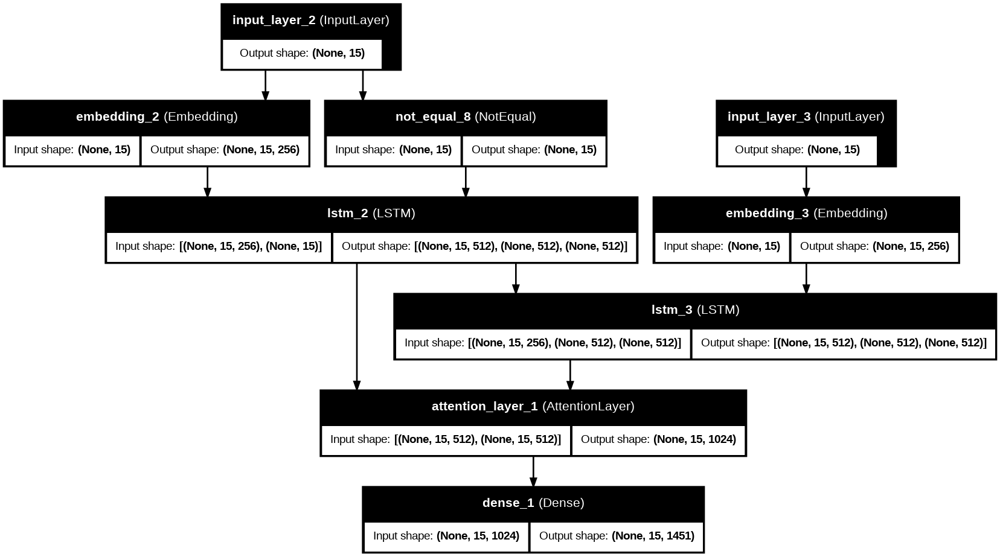

In [176]:
tf.keras.utils.plot_model(
    model,
    to_file="model.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
)

##Define Correction Functions

The objective is to develop a correction system that integrates multiple approaches to ensure accurate and reliable correction of erroneous text. This system utilizes a sequence-to-sequence (seq2seq) model with an attention mechanism, trained to transform erroneous text into correct text. Additionally, it incorporates LanguageTool for grammar and style correction. The process involves loading the seq2seq model, tokenizing and padding the input text, and predicting the corrected sequence. The system then compares the corrected text from both the seq2seq model and LanguageTool to a reference text, such as a number converted to Hindi words. The final output is determined by selecting the method that provides the most accurate correction, ensuring that the corrected text is reliable and consistent.

In [177]:
!pip install language_tool_python
import language_tool_python

In [178]:
def load_seq2seq_model(model_path):
    return tf.keras.models.load_model(model_path, custom_objects={'AttentionLayer': AttentionLayer})

def seq2seq_correction(seq2seq_model, text, tokenizer, max_sequence_length):
    # Tokenize and pad the input text
    tokenized_text = tokenizer.texts_to_sequences([text])
    padded_text = pad_sequences(tokenized_text, maxlen=max_sequence_length, padding='post')

    # Predict using the seq2seq model
    predicted_seq = seq2seq_model.predict([padded_text, padded_text])

    # Convert the predicted sequence back to text
    corrected_tokens = np.argmax(predicted_seq, axis=-1)
    corrected_text = tokenizer.sequences_to_texts(corrected_tokens)

    return clean_text(corrected_text[0])

def language_tool_correction(extracted_text):
    tool = language_tool_python.LanguageTool('en')
    matches = tool.check(extracted_text)
    corrected_text = language_tool_python.utils.correct(extracted_text, matches)
    return clean_text(corrected_text)

def correct_text_using_best_method(amount_digit, extracted_text, seq2seq_model_path='seq2seq_model.keras', tokenizer=None, max_sequence_length=None):
    # Load the Seq2Seq model
    seq2seq_model = load_seq2seq_model(seq2seq_model_path)

    # Convert the amount to Hindi words
    converted_text = number_to_hindi_words(amount_digit)

    # Correct text using Seq2Seq model
    corrected_text_seq2seq = seq2seq_correction(seq2seq_model, extracted_text, tokenizer, max_sequence_length)
    is_correct_seq2seq = (corrected_text_seq2seq == converted_text)

    # Correct text using LanguageTool
    corrected_text_lt = language_tool_correction(extracted_text)
    is_correct_lt = (corrected_text_lt ==converted_text)

    # Choose the method with better performance
    if is_correct_seq2seq:
        final_corrected_text = corrected_text_seq2seq
    elif is_correct_lt:
        final_corrected_text = corrected_text_lt
    else:
        # Default to converted text if neither method is correct
        final_corrected_text = converted_text

    return final_corrected_text, is_correct_seq2seq or is_correct_lt


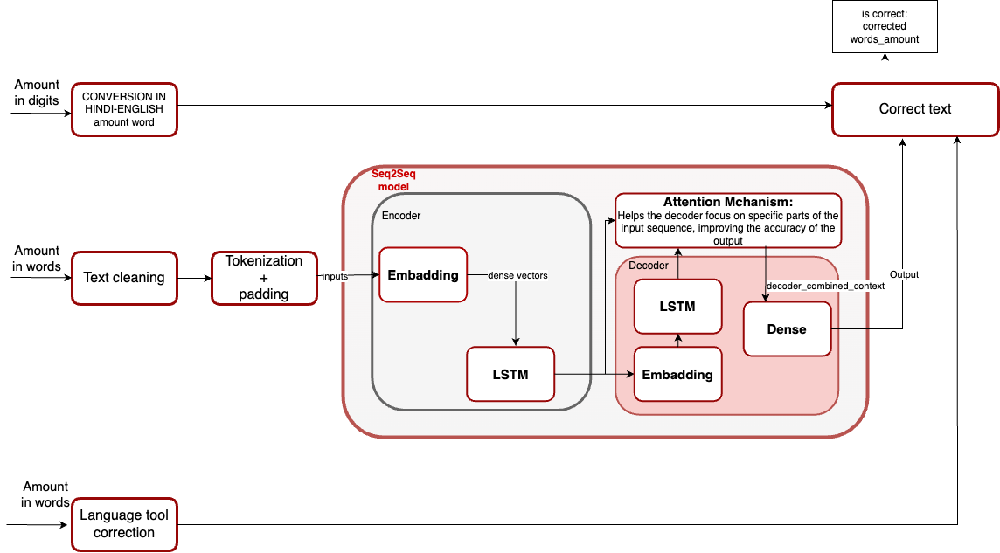

##Evaluation

The objective is to evaluate the performance of the sequence-to-sequence (seq2seq) model .

In [179]:
pip install seqeval


In [ ]:
# Train the model
history = model.fit(
    [erroneous_sequences_padded, correct_sequences_padded],
    correct_sequences_shifted,
    batch_size=64,
    epochs=10,
    validation_split=0.2  # Use 20% of the data for validation
)


Epoch 1/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.9924 - loss: 0.0415 - val_accuracy: 0.9887 - val_loss: 0.0480
Epoch 2/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.9949 - loss: 0.0288 - val_accuracy: 0.9901 - val_loss: 0.0460
Epoch 3/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.9964 - loss: 0.0223 - val_accuracy: 0.9908 - val_loss: 0.0447
Epoch 4/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 89s 2s/step - accuracy: 0.9977 - loss: 0.0155 - val_accuracy: 0.9902 - val_loss: 0.0455
Epoch 5/10
 6/50 ━━━━━━━━━━━━━━━━━━━━ 1:16 2s/step - accuracy: 0.9988 - loss: 0.0115

In [86]:
# Save the trained model
model.save('seq2seq_model.keras')


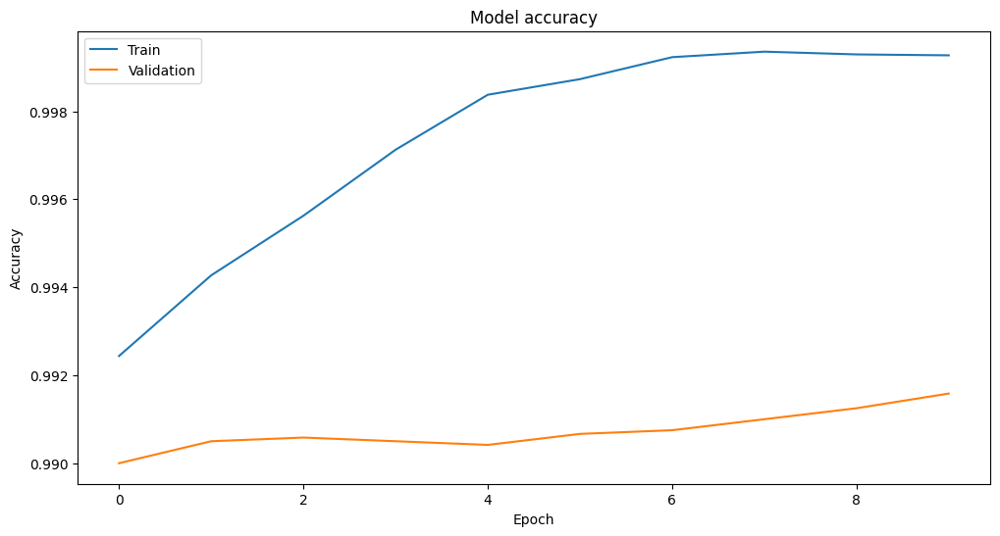

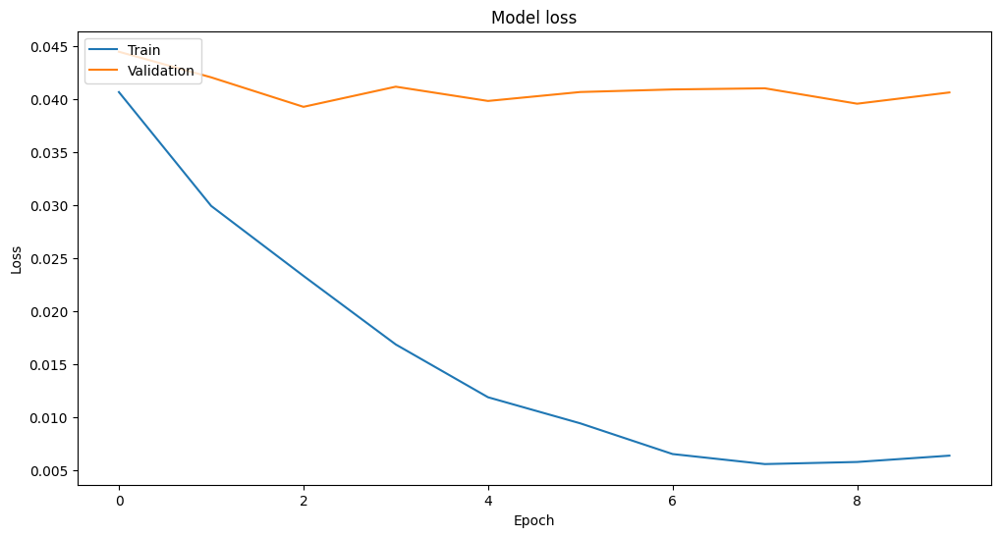

In [87]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [88]:
from sklearn.model_selection import train_test_split

# Assuming `data` is your original DataFrame
train_data, test_data = train_test_split(data, test_size=0.2, random_state=42)


In [89]:
# Prepare test texts
test_correct_texts = test_data['target_text'].astype(str).tolist()
test_erroneous_texts = test_data['input_text'].astype(str).tolist()

# Convert test texts to sequences using the same tokenizer
test_correct_sequences = tokenizer.texts_to_sequences(test_correct_texts)
test_erroneous_sequences = tokenizer.texts_to_sequences(test_erroneous_texts)

# Apply padding to sequences
test_correct_sequences_padded = pad_sequences(test_correct_sequences, maxlen=max_sequence_length, padding='post')
test_erroneous_sequences_padded = pad_sequences(test_erroneous_sequences, maxlen=max_sequence_length, padding='post')

# Shift the target sequences for the test set
test_correct_sequences_shifted = np.zeros_like(test_correct_sequences_padded)
test_correct_sequences_shifted[:, :-1] = test_correct_sequences_padded[:, 1:]

# Add a dimension at the end of the target sequences for the test set
test_correct_sequences_shifted = test_correct_sequences_shifted[:, :, np.newaxis]


In [90]:
# Assuming you have a separate test set (test_erroneous_sequences_padded, test_correct_sequences_shifted)
test_loss, test_accuracy = model.evaluate(
    [test_erroneous_sequences_padded, test_correct_sequences_padded],
    test_correct_sequences_shifted
)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')


25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 179ms/step - accuracy: 0.9974 - loss: 0.0139
Test Loss: 0.012500242330133915
Test Accuracy: 0.9978334903717041


In [91]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def calculate_metrics(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    return accuracy, precision, recall, f1
# Get the predictions from the model
y_pred = model.predict([test_erroneous_sequences_padded, test_correct_sequences_padded])

# Assuming y_true is the actual target sequences from test_correct_sequences_shifted
# You may need to reshape y_pred and y_true appropriately before comparison

y_pred_flat = np.argmax(y_pred, axis=-1).flatten()
y_true_flat = test_correct_sequences_shifted.flatten()

# Calculate metrics
accuracy, precision, recall, f1 = calculate_metrics(y_true_flat, y_pred_flat)


25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 144ms/step


              Score
Metric             
Accuracy   0.997833
Precision  0.997864
Recall     0.997833
F1 Score   0.997834


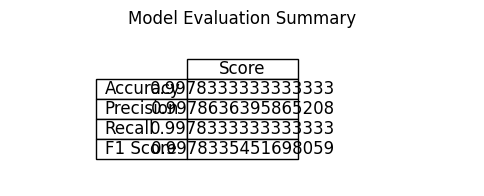

In [92]:
import pandas as pd

# Create a DataFrame for the summary
summary_data = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Score': [accuracy, precision, recall, f1]
}

df_summary = pd.DataFrame(summary_data)

# Set 'Metric' as the index
df_summary.set_index('Metric', inplace=True)

# Display the table
print(df_summary)

# Optionally, you can display it using matplotlib if you want a styled table
import matplotlib.pyplot as plt
from pandas.plotting import table

# Plotting the table
plt.figure(figsize=(6, 2))
plt.title('Model Evaluation Summary')

# Hide axes
ax = plt.gca()
ax.axis('off')

# Create the table
tbl = table(ax, df_summary, loc='center', cellLoc='center', colWidths=[0.2]*len(df_summary.columns))

# Style the table
tbl.auto_set_font_size(False)
tbl.set_fontsize(12)
tbl.scale(1.2, 1.2)

plt.show()



##Test the model

In [93]:
# Example usage
amount_digit = 51000000
extracted_text = "Five Ging Ten aes\n"  # example incorrect text

# Make sure to provide the max_sequence_length as used during training
corrected_text, is_correct = correct_text_using_best_method(amount_digit, extracted_text, tokenizer=tokenizer, max_sequence_length=max_sequence_length)
print(f"Corrected Text: {corrected_text}")
print(f"Is Correct: {is_correct}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


INFO:language_tool_python.download_lt:Unzipping /tmp/tmp0t10jt2r.zip to /root/.cache/language_tool_python.
INFO:language_tool_python.download_lt:Downloaded https://www.languagetool.org/download/LanguageTool-6.4.zip to /root/.cache/language_tool_python.


Corrected Text: five crore, ten lakh
Is Correct: False


In [94]:
import pandas as pd

def apply_correction(ocr_results_df, seq2seq_model_path, tokenizer, max_sequence_length):
    amount_digit = ocr_results_df['amount']
    extracted_text = ocr_results_df['words']

    # Appeler la fonction de correction pour chaque ligne du DataFrame
    corrected_texts = []
    is_correct_flags = []

    for amount, text in zip(amount_digit, extracted_text):
        corrected_text, is_correct = correct_text_using_best_method(amount, text, seq2seq_model_path, tokenizer, max_sequence_length)
        corrected_texts.append(corrected_text)
        is_correct_flags.append(is_correct)

    # Ajouter les résultats dans le DataFrame original
    ocr_results_df['corrected_text'] = corrected_texts
    ocr_results_df['is_correct'] = is_correct_flags

    return ocr_results_df

# Lecture du CSV
ocr_results_df = pd.read_csv('ocr_results.csv')

# Appeler la fonction apply_correction
ocr_results_df = apply_correction(ocr_results_df, seq2seq_model_path='seq2seq_model.keras', tokenizer=tokenizer, max_sequence_length=max_sequence_length)

# Sauvegarder les résultats corrigés dans un nouveau fichier CSV sans l'index
ocr_results_df.to_csv('corrected_ocr_results.csv', index=False)

# Afficher les résultats corrigés directement depuis le DataFrame modifié
for index, row in ocr_results_df.iterrows():
    print(f"Original Text: {row['words']}")
    print(f"Corrected Text: {row['corrected_text']}")
    print(f"Is Correct: {row['is_correct']}\n")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
Original Text: Five Cony, Ten leichs __

Corrected Text: five crore, ten lakh
Is Correct: False



## update csv


In [95]:
def apply_correction(row, seq2seq_model_path, tokenizer, max_sequence_length):
    amount_digit = row['amount']
    extracted_text = row['words']

    corrected_text, is_correct = correct_text_using_best_method(amount_digit, extracted_text, seq2seq_model_path, tokenizer, max_sequence_length)
    return corrected_text

# Load the CSV file into a DataFrame
ocr_results_df = pd.read_csv('ocr_results.csv')
# Apply the correction to the 'words' column
ocr_results_df['corrected_words'] = ocr_results_df.apply(apply_correction, axis=1, seq2seq_model_path='seq2seq_model.keras', tokenizer=tokenizer, max_sequence_length=max_sequence_length)

# Save the corrected results in a new CSV file
ocr_results_df.to_csv('corrected_ocr_results.csv', index=False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


In [96]:
ocr_results_df

,amount,date,words,client,id,corrected_words
0,51000000,15/01/2015,"Five Cony, Ten leichs __\n",___________ Dgaesh_ _Kymay Yuuole\n,309061,"five crore, ten lakh"
